In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import sys
import os

import intersect_test
import line_angles

In [2]:
%pylab inline
pylab.rcParams['figure.figsize'] = (12, 8)

Populating the interactive namespace from numpy and matplotlib


In [3]:
def preprocess(image, blur_value=2, close=False, laplacian=False, thresh=False, opening=False, dialate=False):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.bilateralFilter(gray, 9, 75, 75)
   
    return gray

def calc_edge_map(image, lower_threshold=50, upper_threshold=200, aperture_size=3):
    return cv2.Canny(image, lower_threshold, upper_threshold, apertureSize=aperture_size)

def hough_lines(edge_map, thresh):
    lines = cv2.HoughLinesP(edge_map, rho=1, theta=np.pi / 360, threshold=thresh,
                            minLineLength=60, maxLineGap=10)
    if lines is None:
        return []
    return lines

In [4]:
def point_in_box(x, y, bbox):
    bx, by, bw, bh = bbox
    return(x >= bx and x <= bx + bw and y >= by and y <= by + bh)

def lines_in_bbox_centres(lines, bbox):
    out = []
    for [[x1, y1, x2, y2]] in lines:
        if point_in_box((x1 + x2) / 2, (y1 + y2) / 2, bbox):
            out.append([x1, y1, x2, y2])  
    return out

def lines_hitting_center(lines,x,y, precision = 400):
    out = []
    for [x1, y1, x2, y2] in lines:
        # calculate crossproduct of p1-p . p-p2
        cross_product = np.abs((x - x1) * (y2 - y1) - (y - y1) * (x2 - x1))
        # print(cross_product)
        if cross_product < precision:
            out.append([x1, y1, x2, y2])         
    return out


In [5]:
'''Merging Overlapping Boxes'''
def is_overlap(bbox1, bbox2):
    x,y,w,h = bbox1
    points = ((x,y),(x+w,y),(x,y+h),(x+w,y+h))
    for (_x,_y) in points:
        if point_in_box(_x, _y, bbox2):
            return True
    return False

def merge_bboxes(bbox1,bbox2):    
    x1,y1,w1,h1 = bbox1
    x2,y2,w2,h2 = bbox2
    points=np.array(((x1,y1),(x1+w1,y1),(x1,y1+h1),(x1+w1,y1+h1),
          (x2,y2),(x2+w2,y2),(x2,y2+h2),(x2+w2,y2+h2)))
    
    newx = int(min(points[:,0]))
    newy = int(min(points[:,1]))
    neww = int(max(points[:,0])) - newx
    newh = int(max(points[:,1])) - newy
    return (newx, newy, neww, newh)


def find_overlaps(bbox1,bboxes):
    overlaps = []
    
    for bbox2 in bboxes:
        if is_overlap(bbox1,bbox2):
            overlaps.append(bbox2.tolist())
    
    return overlaps

# Beware, do not enter...
def list_all_overlaps(bboxes):
    overlaps = []
    for bbox1 in bboxes:
        overlaps.append(find_overlaps(bbox1,bboxes))
                            
    final = []
    for overlap in overlaps:
        added = False
        for item in overlap:
            for i, o in enumerate(final):
                if item in o:
                    for _item in overlap: # grim deduplication, sorry.
                        if _item not in final[i]:
                            final[i].append(_item)
                    added = True
                    break
        if not added:
            final.append(overlap)
    return final

def merge_overlapping_bboxes(bboxes):
    out = []
    overlaps = list_all_overlaps(bboxes)
    for overlap in overlaps:
        newbb = overlap[0]
        for oldbb in overlap[1:]:
            newbb = merge_bboxes(newbb, oldbb)
        out.append(newbb)
    return out

In [6]:
'''Drawing Utilities'''

def draw_bbox(image, bbox, colour=(255, 0, 0), thickness=3):
    x, y, w, h = bbox
    cv2.rectangle(image, (x, y), (x + w, y + h), color=colour, thickness=thickness)
    
    return image
    
def plot_lines(image, lines, colour=(0, 255, 0)):
    if lines is None:
        return image
    try:
        for [[x1, y1, x2, y2]] in lines:
            cv2.line(image, (x1, y1), (x2, y2), colour, 2)
    except Exception:
        for [x1, y1, x2, y2] in lines:
            cv2.line(image, (x1, y1), (x2, y2), colour, 2)
        
    return image

def plot_center(image, center, colour=(255, 150, 0)):
    if center is None:
        return image
    cv2.circle(image, center, 6, colour, -3)
    return image

In [42]:
'''Removes False-Positive Viola-Jones Bounding Boxes'''
def filter_bboxs(image, lines, circles, bbox, min_lines=8):
    filter_box = False
    
    lines = lines_in_bbox_centres(lines, bbox)
    lines_center = intersect_test.lines_center_point(lines)

    lines = line_angles.remove_horizontals(lines, np.deg2rad(5))
    lines = line_angles.remove_vertical(lines, np.deg2rad(5))
    
    if lines_center:
        lines = lines_hitting_center(lines, lines_center[0], lines_center[1])
        
    # Filter bbox if intersection exists and not in bbox
    if lines_center and not point_in_box(lines_center[0], lines_center[1], bbox):
        filter_box = True
    
    # Filter if too few lines or circles
    if len(circles) == 0 and len(lines) < min_lines:
        filter_box = True
        
    return (filter_box, lines, lines_center, circles)

In [8]:
def detect(image, display=False, threshold=60, min_lines=8):
    original_image = image.copy()
    
    cascade = cv2.CascadeClassifier("../task2/cascade.xml")
    bboxes = cascade.detectMultiScale(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))
    
    image = preprocess(image)
    edge_map = calc_edge_map(image, lower_threshold=50, upper_threshold=100)
    lines = hough_lines(edge_map,threshold) 
    
    if display:
        plot_lines(original_image, lines)
    
    # For each bounding box, display bounding box and matching lines/circles
    bboxes_with_dartboards = []
    dartboard_count = 0
    for bbox in bboxes:
        filter_box, bbox_lines, bbox_lines_center, bbox_circles = filter_bboxs(image, lines, [], bbox, min_lines)
        
        if not filter_box:
            bboxes_with_dartboards.append(bbox)
            dartboard_count += 1        
            if display:
                plot_lines(original_image, bbox_lines, colour=(255, 0, 0))
                plot_center(original_image, bbox_lines_center)

                
    merged_bboxes = merge_overlapping_bboxes(bboxes_with_dartboards)
        
    if display:
        [draw_bbox(original_image, bbox) for bbox in merged_bboxes]
        plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        plt.show()
        
    return (len(merged_bboxes), merged_bboxes)

In [34]:
'''Checks all images in folder for dartboards'''
def check(path, display=False, threshold=60, min_lines=8, limit=None):
    out = {}
    for i, img_path in enumerate(os.listdir(path)):
        if img_path[0] == '.': # Ignore hidden files
            continue
            
        if limit is not None and i > limit:
            break

        out[img_path] = check_single(path + '/' + img_path, display, threshold, min_lines)

    return out

'''Checks all images in folder for dartboards'''
def check_single(path, display=True, threshold=60, min_lines=8):            
    image = cv2.imread(path)
    dartboard_count, _ = detect(image, display, threshold, min_lines)

    if display:
        print(path, dartboard_count)

    return dartboard_count


'''Calculate F1 Score'''
def score(pos, real, negs):
    false_positives = 0
    true_positives = 0
    false_negatives = 0

    for img, detected in pos.items():
        if detected > real[img]:
            false_positives += detected - real[img]
        if detected < real[img]:
            false_negatives += real[img] - detected
        true_positives += min(detected, real[img])

    for img, detected in negs.items():
        false_positives += detected

    precision = true_positives/(true_positives+false_positives)
    recall = true_positives/(true_positives+false_negatives)
    f1 = 2*(precision * recall)/(precision+recall)
    return f1, precision, recall

In [10]:
real = {'dart0.jpg': 1,
 'dart1.jpg': 1,
 'dart10.jpg': 3,
 'dart11.jpg': 1,
 'dart12.jpg': 1,
 'dart13.jpg': 1,
 'dart14.jpg': 2,
 'dart15.jpg': 1,
 'dart2.jpg': 1,
 'dart3.jpg': 1,
 'dart4.jpg': 1,
 'dart5.jpg': 1,
 'dart6.jpg': 1,
 'dart7.jpg': 1,
 'dart8.jpg': 2,
 'dart9.jpg': 1}

# Demos

## Example from positive dataset with relaxed parameters (min_lines=3)

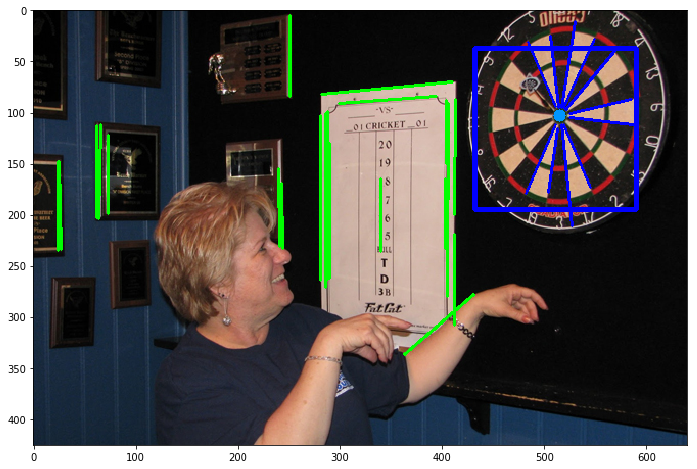

../../data/test_images/dart0.jpg 1


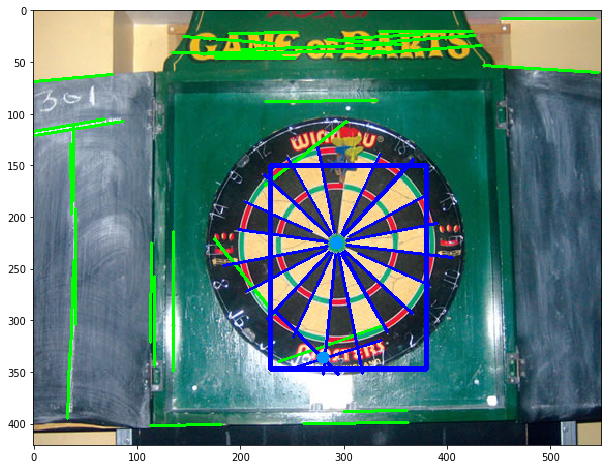

../../data/test_images/dart1.jpg 1


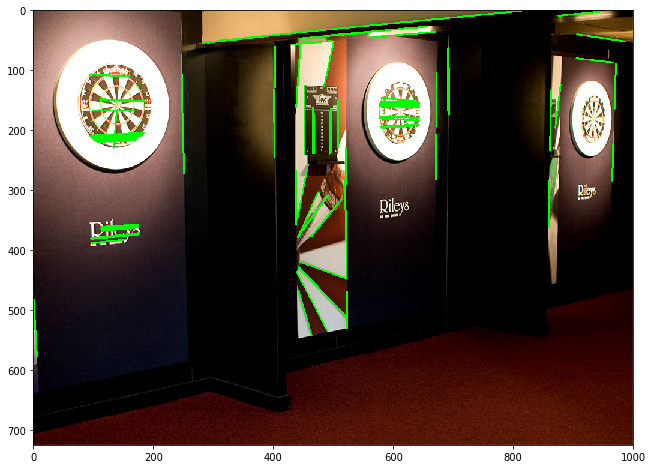

../../data/test_images/dart10.jpg 0


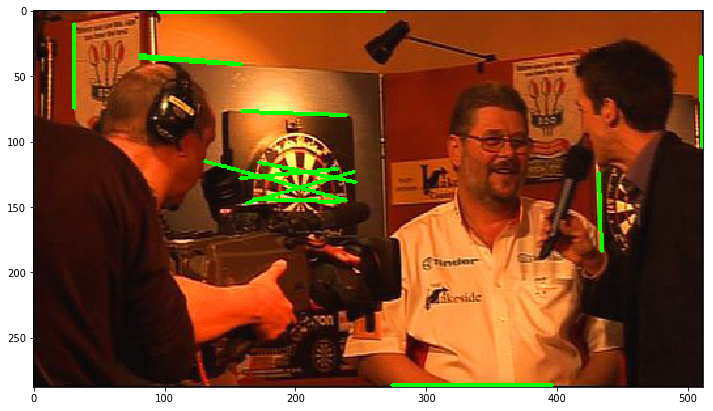

../../data/test_images/dart11.jpg 0


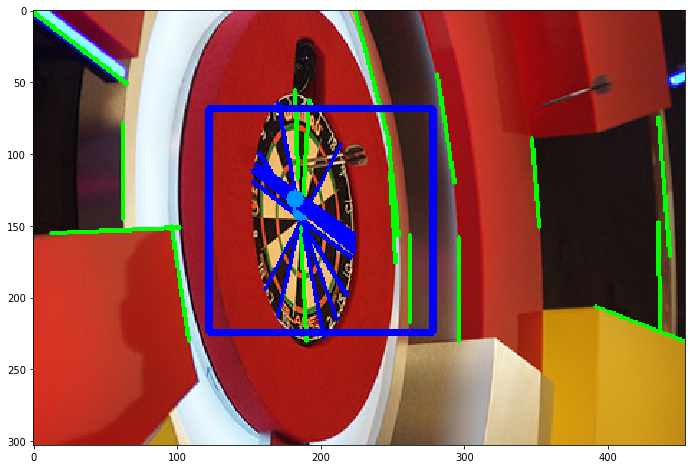

../../data/test_images/dart12.jpg 1


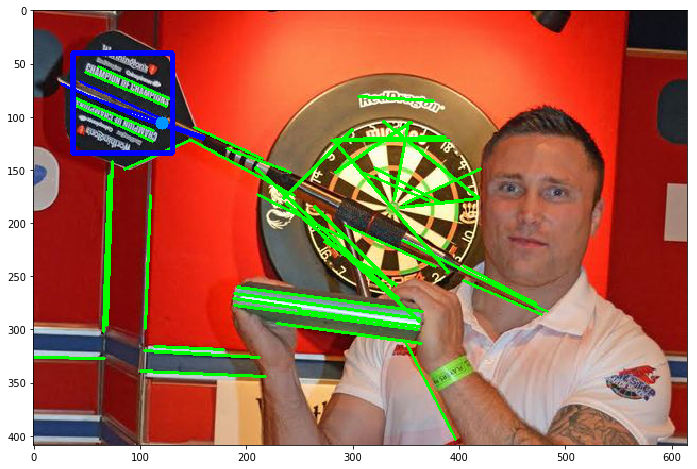

../../data/test_images/dart13.jpg 1


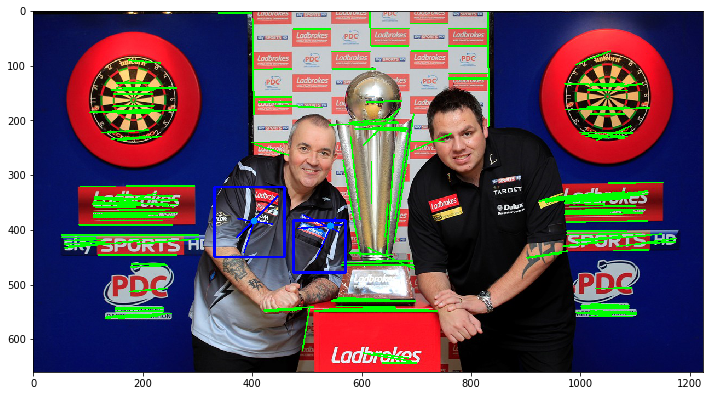

../../data/test_images/dart14.jpg 2


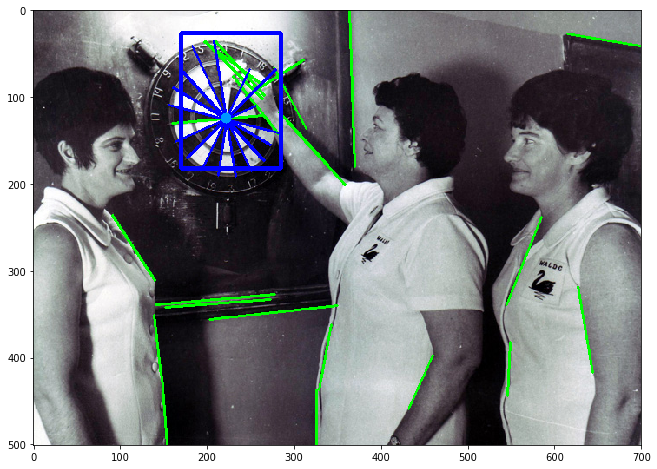

../../data/test_images/dart15.jpg 1


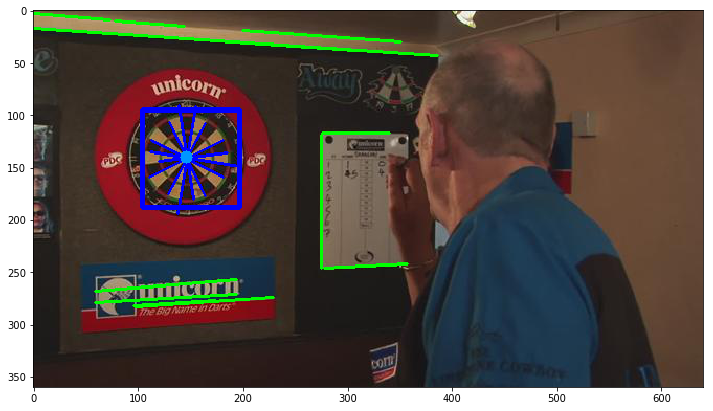

../../data/test_images/dart2.jpg 1


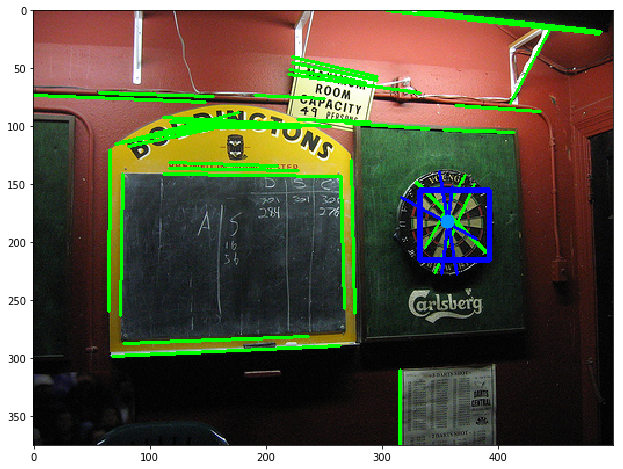

../../data/test_images/dart3.jpg 1


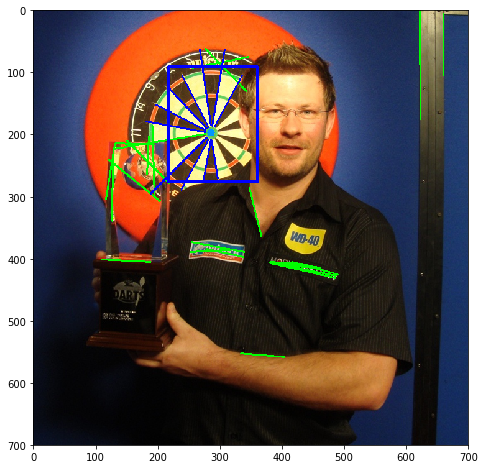

../../data/test_images/dart4.jpg 1


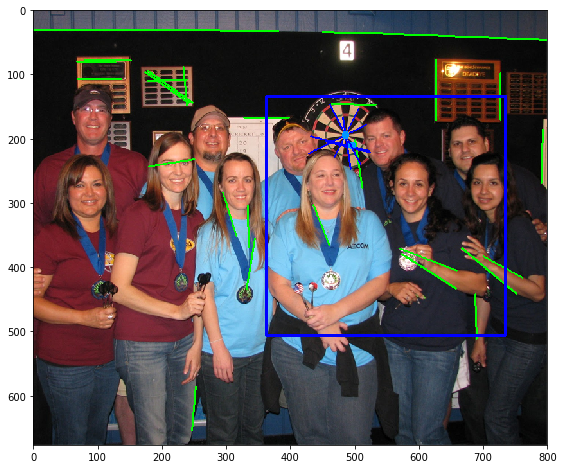

../../data/test_images/dart5.jpg 1


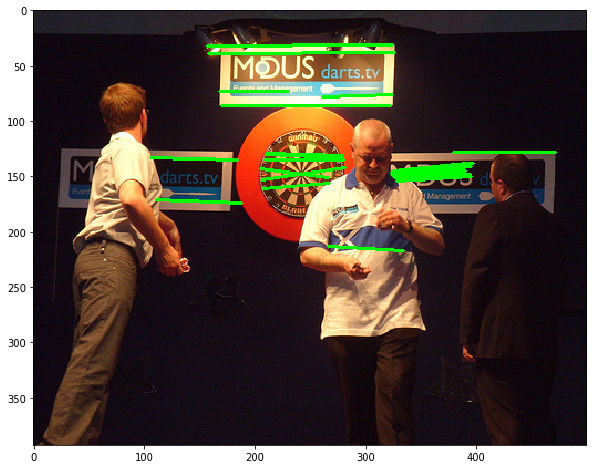

../../data/test_images/dart6.jpg 0


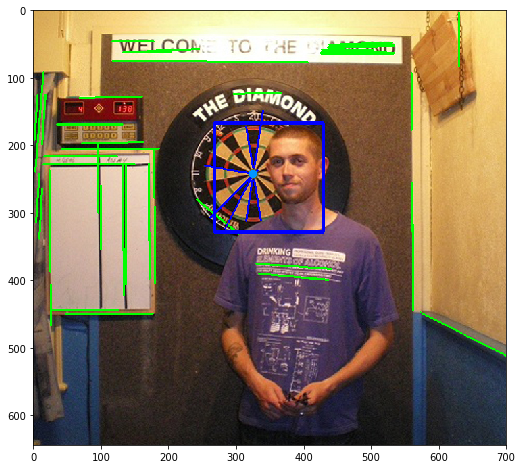

../../data/test_images/dart7.jpg 1


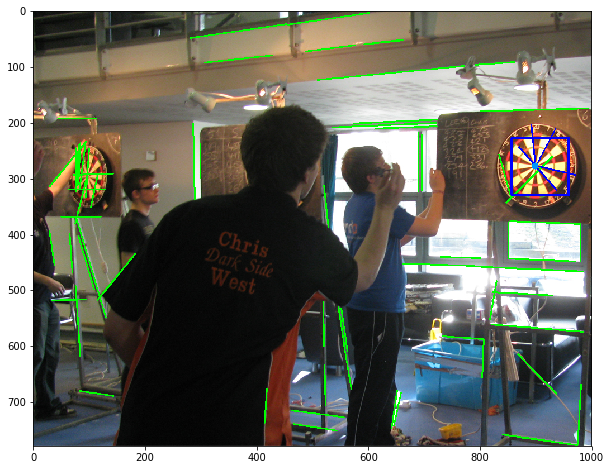

../../data/test_images/dart8.jpg 1


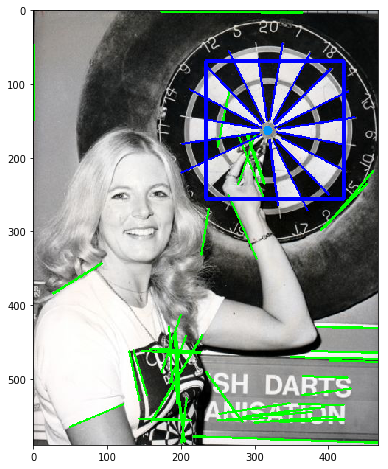

../../data/test_images/dart9.jpg 1


In [43]:
_ = check('../../data/test_images', display=True, min_lines=3)

## Examples from positive dataset

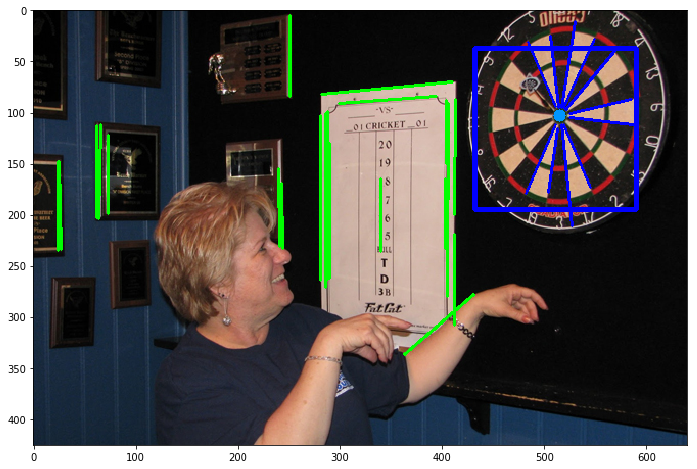

../../data/test_images/dart0.jpg 1


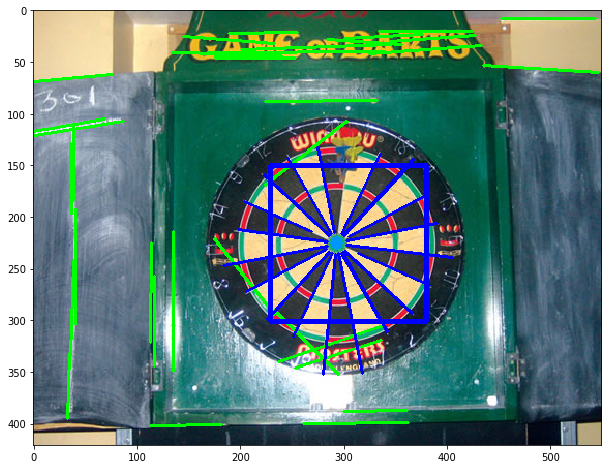

../../data/test_images/dart1.jpg 1


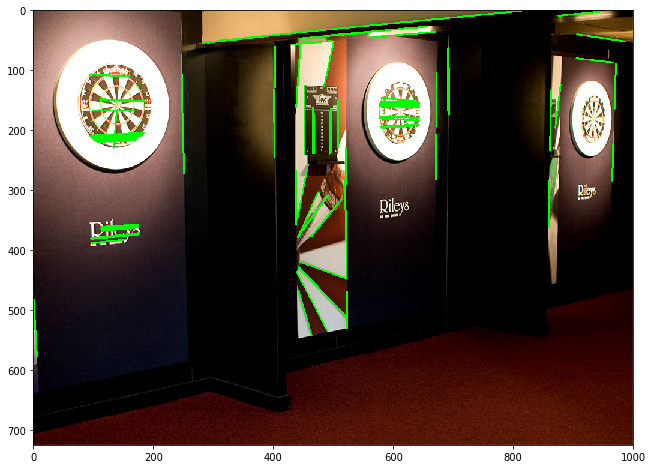

../../data/test_images/dart10.jpg 0


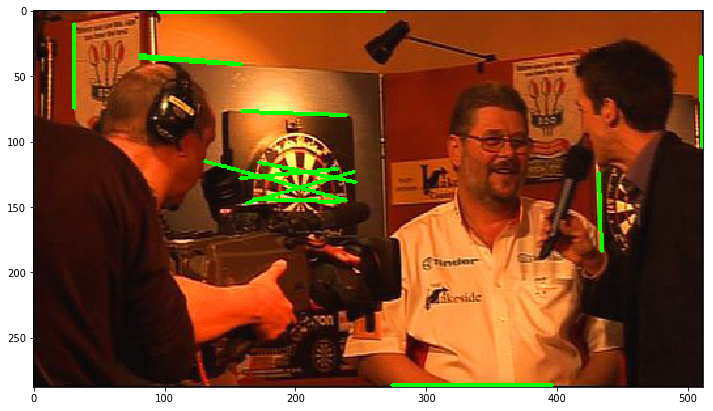

../../data/test_images/dart11.jpg 0


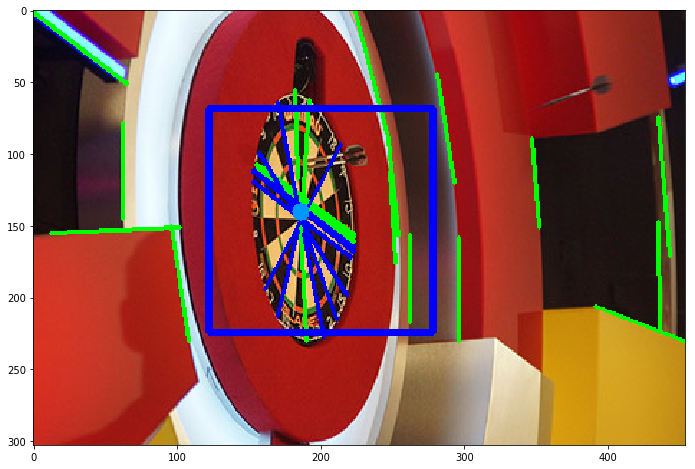

../../data/test_images/dart12.jpg 1


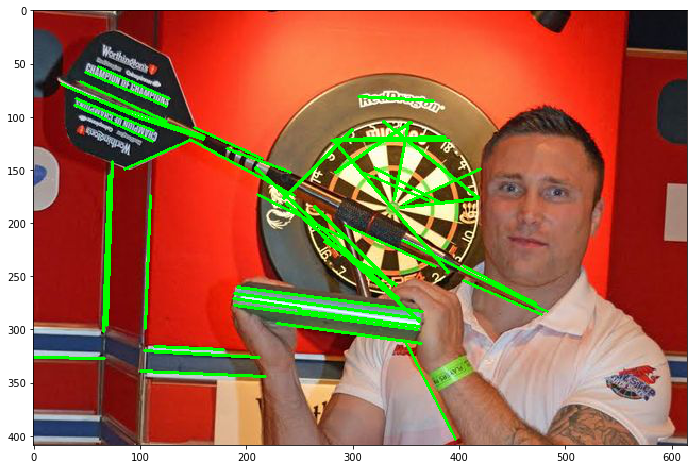

../../data/test_images/dart13.jpg 0


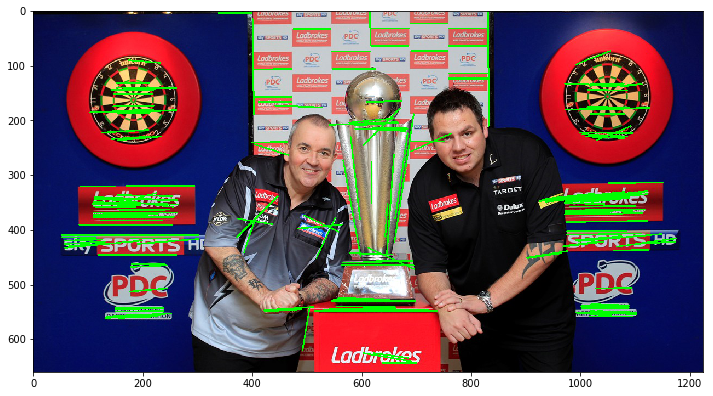

../../data/test_images/dart14.jpg 0


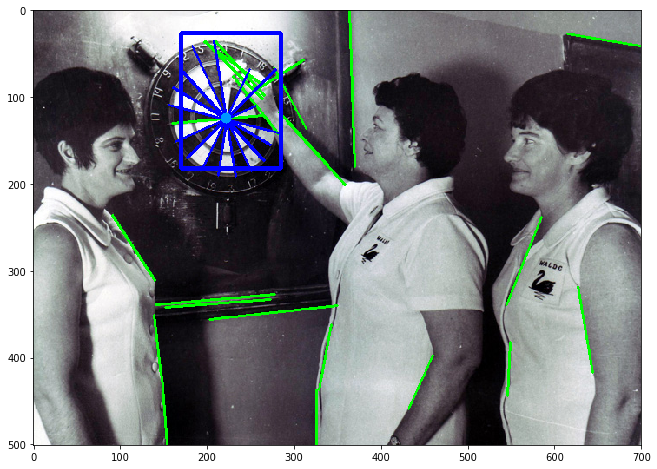

../../data/test_images/dart15.jpg 1


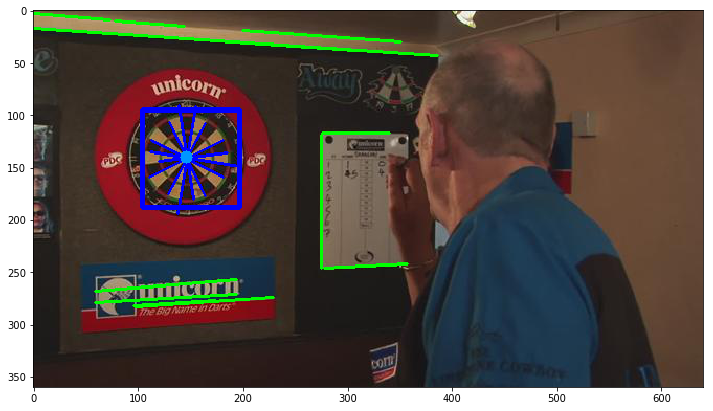

../../data/test_images/dart2.jpg 1


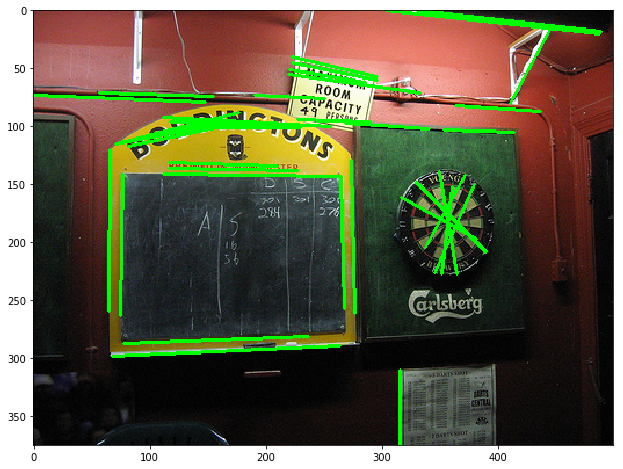

../../data/test_images/dart3.jpg 0


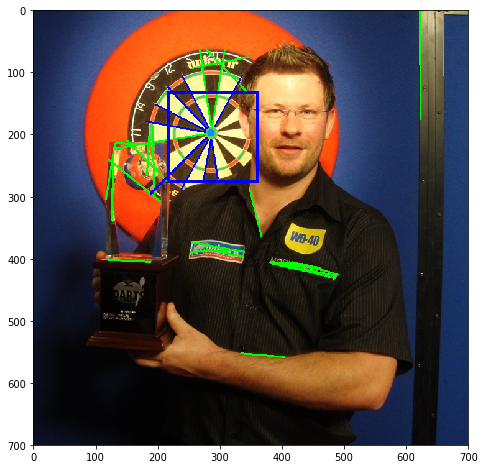

../../data/test_images/dart4.jpg 1


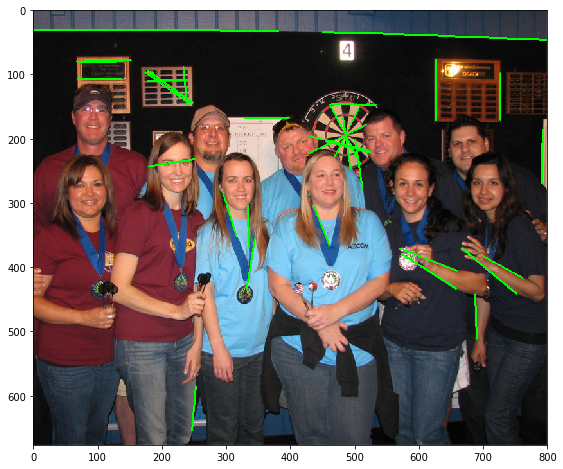

../../data/test_images/dart5.jpg 0


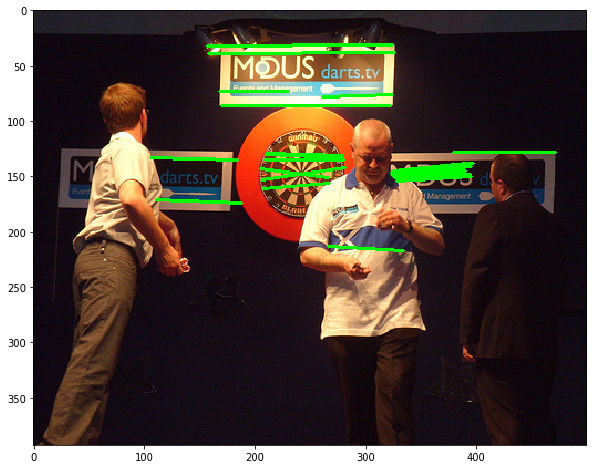

../../data/test_images/dart6.jpg 0


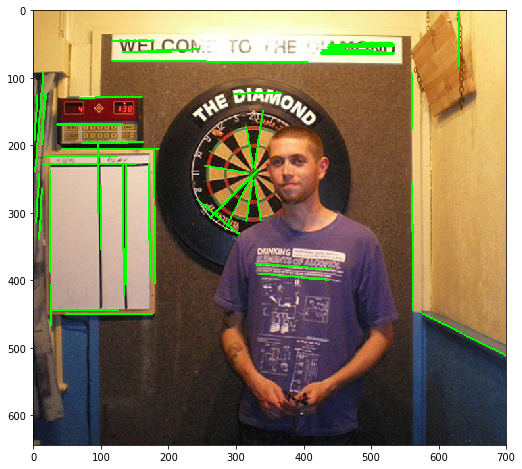

../../data/test_images/dart7.jpg 0


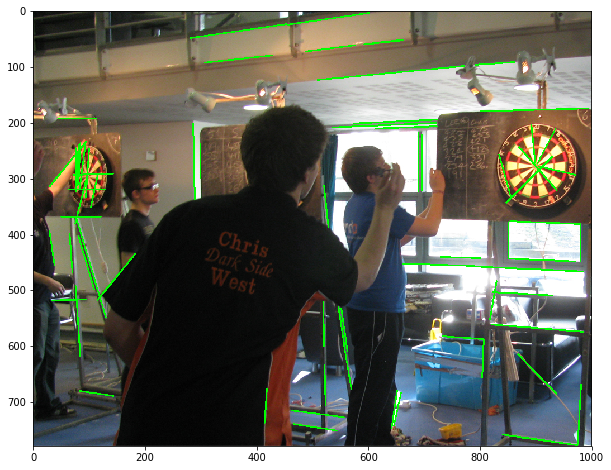

../../data/test_images/dart8.jpg 0


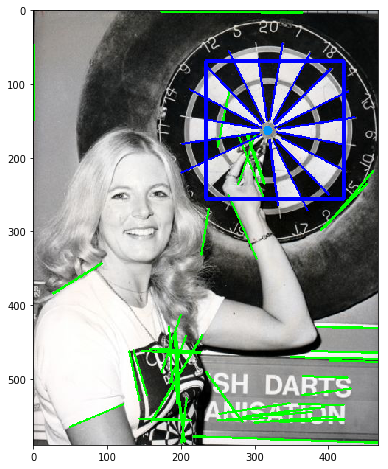

../../data/test_images/dart9.jpg 1


In [37]:
_ = check('../../data/test_images', display=True)

# Examples false positives

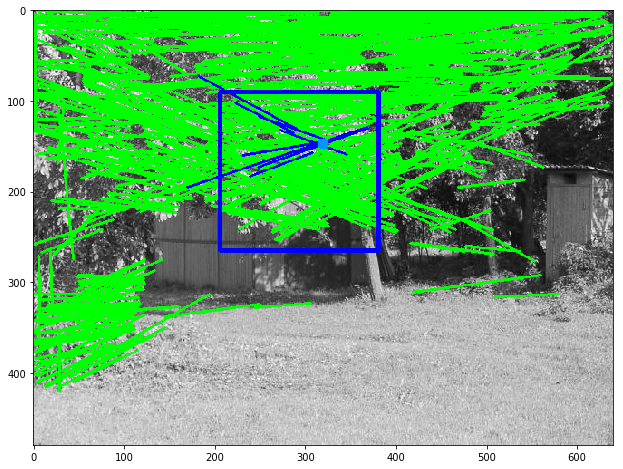

../../data/negatives/neg-0019.jpg 1


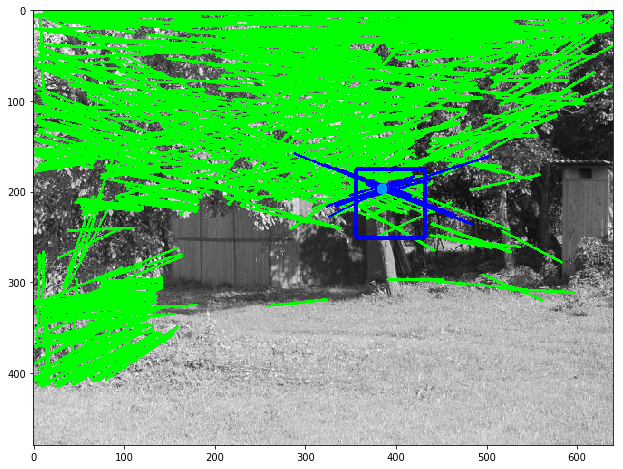

../../data/negatives/neg-0020.jpg 1


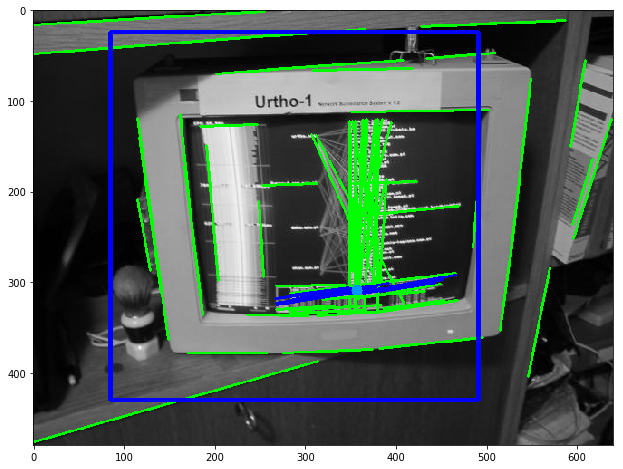

../../data/negatives/neg-0066.jpg 1


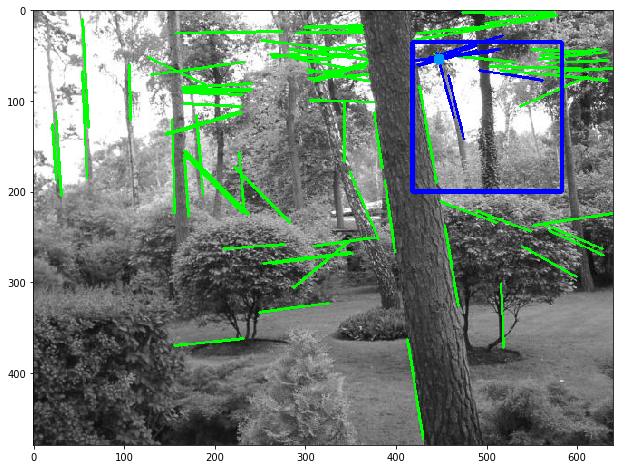

../../data/negatives/neg-0652.jpg 1


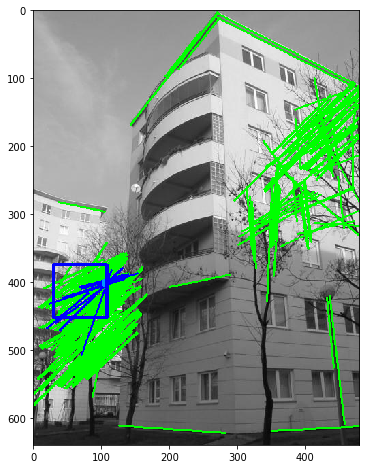

../../data/negatives/neg-0990.jpg 1


1

In [41]:
check_single('../../data/negatives/neg-0019.jpg')
check_single('../../data/negatives/neg-0020.jpg')
check_single('../../data/negatives/neg-0066.jpg')
check_single('../../data/negatives/neg-0652.jpg')
check_single('../../data/negatives/neg-0990.jpg')

# Scoring

In [44]:
task3_negatives = check('../../data/negatives')
task3_positives = check('../../data/test_images')
print('f1: %.2f, precision: %.2f, recall: %.2f' % score(task3_positives,real,task3_negatives))

f1: 0.44, precision: 0.58, recall: 0.35
